# Imports

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import random
import os
from datetime import datetime
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow import keras
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import (Input, Conv2D, AveragePooling2D, Flatten, Dense, Concatenate,
                                     Rescaling, MaxPooling2D, BatchNormalization, Dropout, Add,
                                     Multiply, GlobalAveragePooling2D, Activation, DepthwiseConv2D)
from tensorflow.keras.models import Model
from datetime import datetime as dt
from tensorflow.keras.callbacks import TensorBoard
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, classification_report

# Helper Functions

In [2]:
! wget https://raw.githubusercontent.com/DriveMyScream/Python_libraries/main/helper_functions.py

--2023-09-24 19:01:36--  https://raw.githubusercontent.com/DriveMyScream/Python_libraries/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7752 (7.6K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]   7.57K  --.-KB/s    in 0s      

2023-09-24 19:01:36 (73.8 MB/s) - ‘helper_functions.py’ saved [7752/7752]



In [3]:
from helper_functions import make_confusion_matrix, calculate_results

In [4]:
def plot_loss_curves(history, train_loss, val_loss, train_acc, val_acc):
    loss = np.array(history.history[train_loss])
    val_loss = np.array(history.history[val_loss])

    accuracy = np.array(history.history[train_acc])
    val_accuracy = np.array(history.history[val_acc])

    epochs = range(len(history.history[train_loss]))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Plot loss
    ax1.plot(epochs, loss, label='training_loss', marker='o')
    ax1.plot(epochs, val_loss, label='val_loss', marker='o')

    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)

    ax1.set_title('Loss (Lower Means Better)', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend()

    # Plot accuracy
    ax2.plot(epochs, accuracy, label='training_accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='val_accuracy', marker='o')

    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)

    ax2.set_title('Accuracy (Higher Means Better)', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend();

# Data Downloading

In [5]:
! pip install -q kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 /root/.kaggle/kaggle.json
! kaggle datasets download -d rudreshveerkhare/face2bmi-alignedimgs
! unzip "/content/face2bmi-alignedimgs.zip" -d "/content/dataset"

Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/dataset/Y27460.png  
  inflating: /content/dataset/dataset/Y27461.png  
  inflating: /content/dataset/dataset/Y27462.png  
  inflating: /content/dataset/dataset/Y27463.png  
  inflating: /content/dataset/dataset/Y27464.png  
  inflating: /content/dataset/dataset/Y27465.png  
  inflating: /content/dataset/dataset/Y27466.png  
  inflating: /content/dataset/dataset/Y27467.png  
  inflating: /content/dataset/dataset/Y27468.png  
  inflating: /content/dataset/dataset/Y27469.png  
  inflating: /content/dataset/dataset/Y27470.png  
  inflating: /content/dataset/dataset/Y27471.png  
  inflating: /content/dataset/dataset/Y27472.png  
  inflating: /content/dataset/dataset/Y27473.png  
  inflating: /content/dataset/dataset/Y27474.png  
  inflating: /content/dataset/dataset/Y27475.png  
  inflating: /content/dataset/dataset/Y27476.png  
  inflating: /content/dataset/dataset/Y27478.png  
  inflating: /content/dataset/d

# Data Loading

In [6]:
df = pd.read_csv("/content/dataset/Final_Dataset.csv")

In [7]:
df.head(5)

,id,sex,age,BMI
0,M10909.png,Male,33,24.679446
1,M16885.png,Male,38,21.614441
2,B83719.png,Male,35,22.494637
3,R06086.png,Male,36,31.561353
4,M10350.png,Male,34,21.696216


In [8]:
# images_path = [image for image in os.listdir("/content/dataset/dataset")]
# images_df = [image for image in df['id']]
# images_not_exist = [image for image in images_df if image not in images_path]
# df = df[~df['id'].isin(images_not_exist)]
# print("The total images which are not exists in dataframe:", len(images_not_exist))

In [9]:
for index, row in df.iterrows():
  image_path = os.path.join("/content/dataset/dataset", row['id'])
  df.at[index, 'image_path'] = image_path

In [10]:
male_df = df[df['sex'] == 'Male'].sample(20000)
female_df = df[df['sex'] == 'Female']
df = pd.concat([male_df, female_df], ignore_index=True)
df = df.sample(frac=1, random_state=42).reset_index(drop=True)

In [11]:
df['sex'].value_counts()

Male      20000
Female     3649
Name: sex, dtype: int64

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23649 entries, 0 to 23648
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          23649 non-null  object 
 1   sex         23649 non-null  object 
 2   age         23649 non-null  int64  
 3   BMI         23649 non-null  float64
 4   image_path  23649 non-null  object 
dtypes: float64(1), int64(1), object(3)
memory usage: 923.9+ KB


# Data Visulization

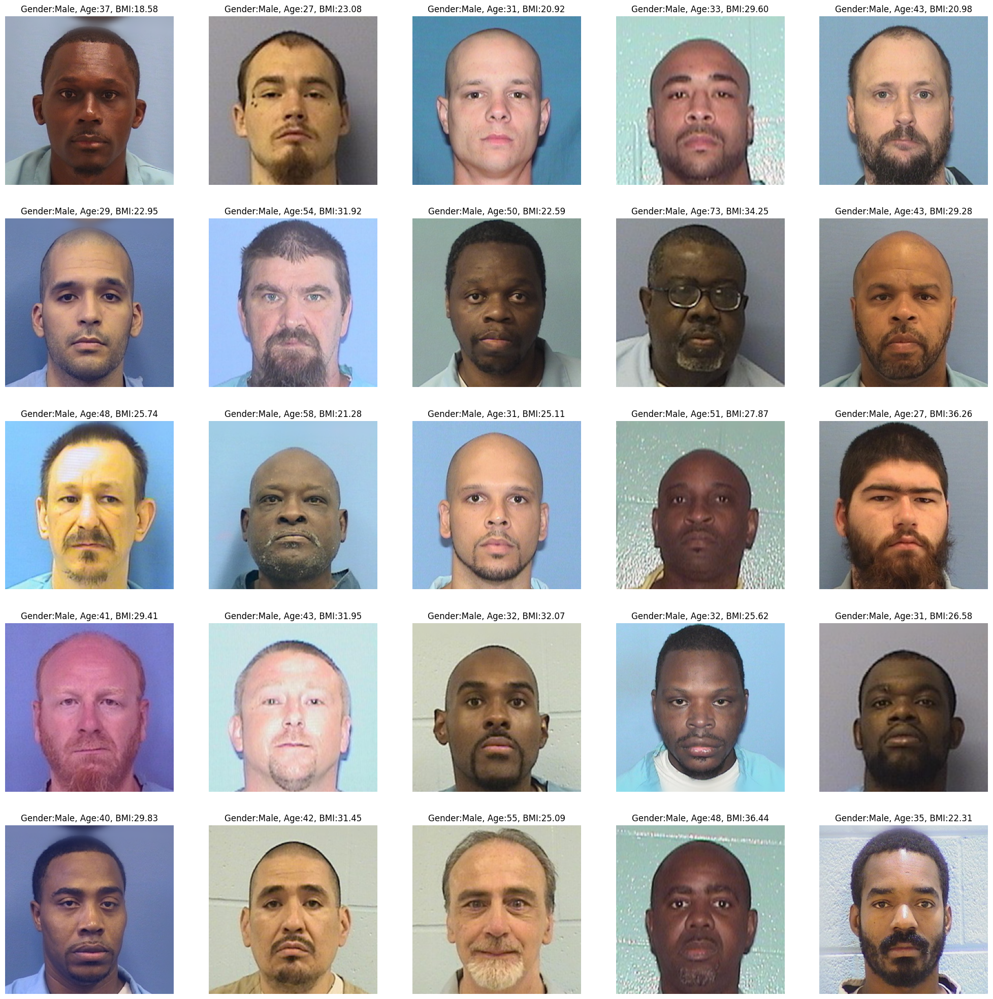

In [13]:
random_sample = df.sample(25)
random_images = random_sample['image_path'].values
random_sex = random_sample['sex'].values
random_age = random_sample['age'].values
random_bmi = random_sample['BMI'].values
plt.figure(figsize=(25, 25))
for i in range(25):
  plt.subplot(5, 5, i+1, xticks=[], yticks=[])
  image = plt.imread(random_images[i])
  plt.imshow(image)
  plt.title("Gender:{}, Age:{}, BMI:{:.2f}".format(random_sex[i], random_age[i], random_bmi[i]))
  plt.axis('off')

# Data Loading

In [14]:
images_list = []
gender_list = []
age_list = []
bmi_list = []

for _, row in df.iterrows():
  image_path = row['image_path']
  images_list.append(image_path)
  age = row['age']
  age_list.append(age)
  gender = row['sex']
  gender_list.append(gender)
  bmi = row['BMI']
  bmi_list.append(bmi)

label_encoder = LabelEncoder()
gender_list = label_encoder.fit_transform(gender_list)
classes = label_encoder.classes_
num_classes = len(classes)
print("Gender Classes:", classes)
print("Total Classes of Gender:", num_classes)

print("Number of images in dataset is:", len(images_list))
print("Number of gender in dataset is:", len(gender_list))
print("Number of age in dataset is:", len(age_list))
print("Number of bmi in dataset is:", len(bmi_list))

Gender Classes: ['Female' 'Male']
Total Classes of Gender: 2
Number of images in dataset is: 23649
Number of gender in dataset is: 23649
Number of age in dataset is: 23649
Number of bmi in dataset is: 23649


In [15]:
images_data = tf.data.Dataset.from_tensor_slices(images_list)
gender_data = tf.data.Dataset.from_tensor_slices(gender_list)
age_data = tf.data.Dataset.from_tensor_slices(age_list)
bmi_data = tf.data.Dataset.from_tensor_slices(bmi_list)

dataset = tf.data.Dataset.zip((images_data, {'gender':gender_data,  'age': age_data, 'bmi': bmi_data}))

In [16]:
for inputs, outputs in dataset.take(1):
  gender, age, bmi = outputs['gender'], outputs['age'], outputs['bmi']
  print(inputs)
  print("Gender:", gender)
  print("Age:", age)
  print("BMI:", bmi)

tf.Tensor(b'/content/dataset/dataset/B88891.png', shape=(), dtype=string)
Gender: tf.Tensor(1, shape=(), dtype=int64)
Age: tf.Tensor(31, shape=(), dtype=int32)
BMI: tf.Tensor(23.168762, shape=(), dtype=float32)


In [17]:
IMG_SIZE = 128
def get_images(image_path, gender, age, bmi):
  image = tf.io.decode_jpeg(tf.io.read_file(image_path), channels=3)
  image = tf.cast(tf.image.resize(image, (IMG_SIZE, IMG_SIZE)), dtype=tf.float32)
  return image, {'gender': gender, 'age': age, 'bmi': bmi}

In [18]:
dataset = dataset.map(lambda inputs, outputs: get_images(inputs, outputs['gender'], outputs['age'], outputs['bmi']))

In [19]:
for inputs, outputs in dataset.take(1):
  gender, age, bmi = outputs['gender'], outputs['age'], outputs['bmi']
  print(inputs.shape)
  print("Gender:", gender)
  print("Age:", age)
  print("BMI:", bmi)

(128, 128, 3)
Gender: tf.Tensor(1, shape=(), dtype=int64)
Age: tf.Tensor(31, shape=(), dtype=int32)
BMI: tf.Tensor(23.168762, shape=(), dtype=float32)


# Splitting data

In [20]:
def split_dataset(dataset, TRAIN_RATIO):
  dataset_size = len(dataset)
  train_dataset = dataset.take(int(TRAIN_RATIO * dataset_size))
  test_dataset = dataset.skip(int(TRAIN_RATIO * dataset_size))

  return train_dataset, test_dataset

In [21]:
train_dataset, test_dataset = split_dataset(dataset, TRAIN_RATIO=0.80)

In [22]:
print("Number of Training Examples in Training data:", len(train_dataset))
print("Number of Testing Examples in Testing data:", len(test_dataset))

Number of Training Examples in Training data: 18919
Number of Testing Examples in Testing data: 4730


# Data Visulization

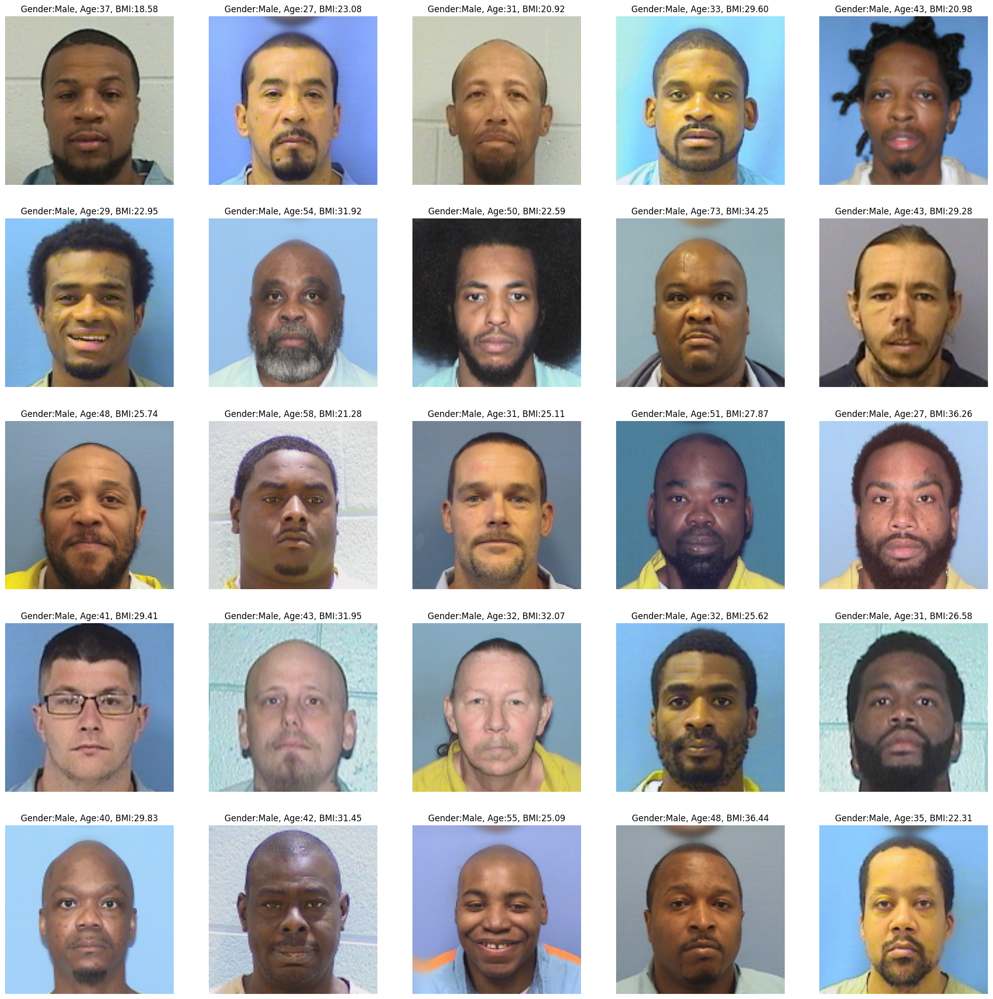

In [23]:
plt.figure(figsize=(25, 25))
for i, (inputs, outputs) in enumerate(train_dataset.take(25)):
  gender, age, bmi = outputs['gender'], outputs['age'], outputs['bmi']
  plt.subplot(5, 5, i+1, xticks=[], yticks=[])
  plt.imshow(inputs/255)
  plt.title("Gender:{}, Age:{}, BMI:{:.2f}".format(random_sex[i], random_age[i], random_bmi[i]))
  plt.axis('off')

plt.show()

# Data Loading

In [24]:
train_dataset = (train_dataset
                .batch(64)
                .prefetch(tf.data.AUTOTUNE))

In [25]:
test_dataset = (test_dataset
                .batch(64)
                .prefetch(tf.data.AUTOTUNE))

# Model Building

In [26]:
from tensorflow.keras.applications.resnet import ResNet101
from tensorflow.keras.applications.resnet import preprocess_input

base_model = ResNet101(weights='imagenet',
                      input_shape=(128, 128, 3),
                      include_top=False)
base_model.trainable = False

input_layer = Input(shape=(128, 128, 3))
preprocess_layer = preprocess_input(input_layer)
x = base_model(preprocess_layer, training=False)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)

gender = Dense(units=512, activation='relu')(x)
gender = Dropout(0.5)(gender)
output_gender = Dense(units=1, activation='sigmoid', name='gender')(gender)

age = Dense(units=512, activation='relu')(x)
age = Dropout(0.5)(age)
output_age = Dense(units=1, name='age')(age)

bmi = Dense(units=512, activation='relu')(x)
bmi = Dropout(0.5)(bmi)
output_bmi = Dense(units=1, name='bmi')(bmi)

model = Model(inputs=input_layer, outputs=[output_gender, output_age, output_bmi])
model.summary()

171446536/171446536 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 tf.__operators__.getitem (  (None, 128, 128, 3)          0         ['input_2[0][0]']             
 SlicingOpLambda)                                                                                 
                                                                                                  
 tf.nn.bias_add (TFOpLambda  (None, 128, 128, 3)          0         ['tf.__operators__.getitem[0][
 )                                                                  0]']                          
                           

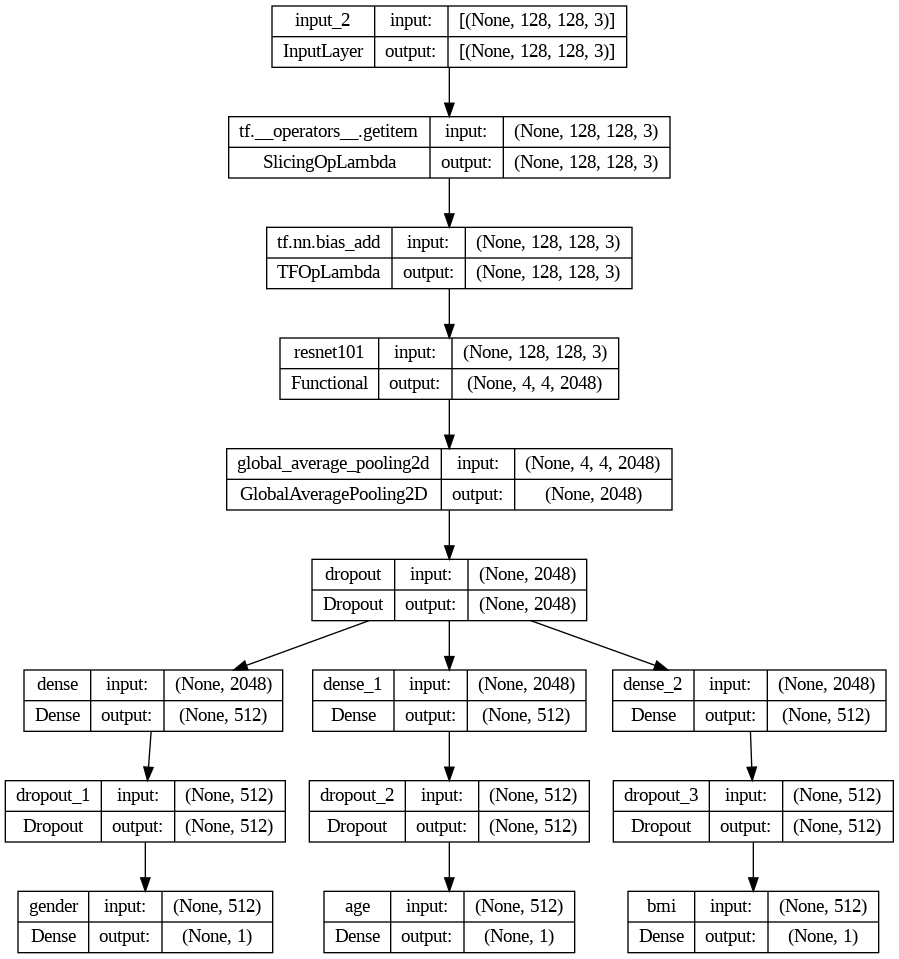

In [27]:
plot_model(model, show_shapes=True)

In [28]:
model.compile(optimizer = 'adam',
    loss = {'gender': 'binary_crossentropy', 'age': 'mse', 'bmi': 'mse'},
    metrics = {'gender': 'accuracy', 'age': 'mae', 'bmi': 'mae'})

In [29]:
history = model.fit(train_dataset,
                    validation_data=test_dataset,
                    epochs=10)

Epoch 1/10
296/296 [==============================] - 135s 396ms/step - loss: 172.8452 - gender_loss: 0.1730 - age_loss: 122.9573 - bmi_loss: 49.7150 - gender_accuracy: 0.9534 - age_mae: 8.6514 - bmi_mae: 5.2701 - val_loss: 109.3224 - val_gender_loss: 0.0473 - val_age_loss: 78.7020 - val_bmi_loss: 30.5730 - val_gender_accuracy: 0.9829 - val_age_mae: 6.9981 - val_bmi_mae: 4.0596
Epoch 2/10
296/296 [==============================] - 87s 293ms/step - loss: 139.7676 - gender_loss: 0.0782 - age_loss: 101.0554 - bmi_loss: 38.6340 - gender_accuracy: 0.9719 - age_mae: 7.9726 - bmi_mae: 4.7682 - val_loss: 117.3986 - val_gender_loss: 0.0435 - val_age_loss: 86.5564 - val_bmi_loss: 30.7987 - val_gender_accuracy: 0.9858 - val_age_mae: 7.2833 - val_bmi_mae: 4.0723
Epoch 3/10
296/296 [==============================] - 86s 292ms/step - loss: 136.2482 - gender_loss: 0.0657 - age_loss: 98.9568 - bmi_loss: 37.2257 - gender_accuracy: 0.9770 - age_mae: 7.8500 - bmi_mae: 4.6893 - val_loss: 126.5879 - val_ge

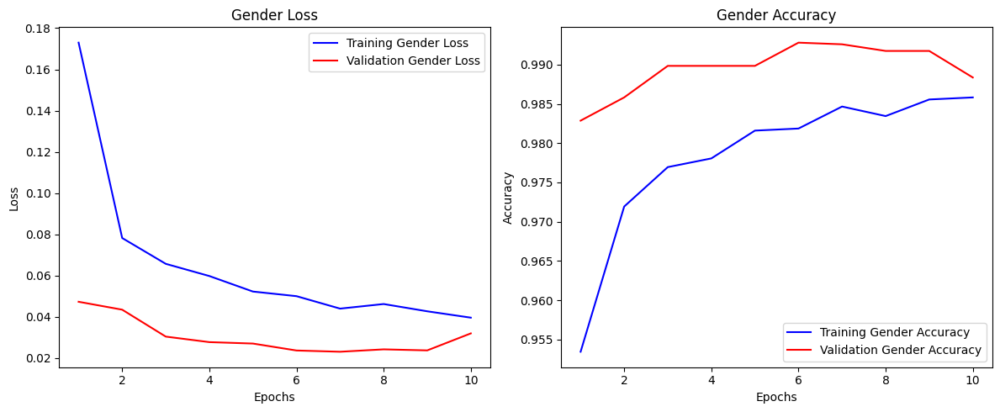

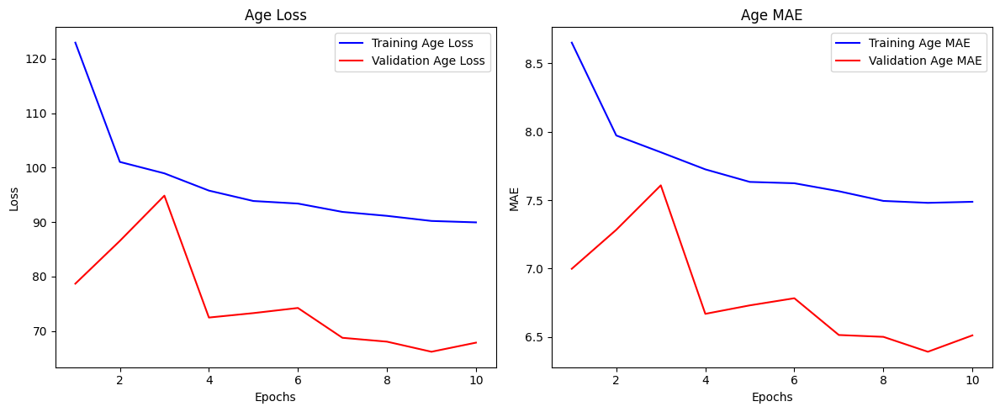

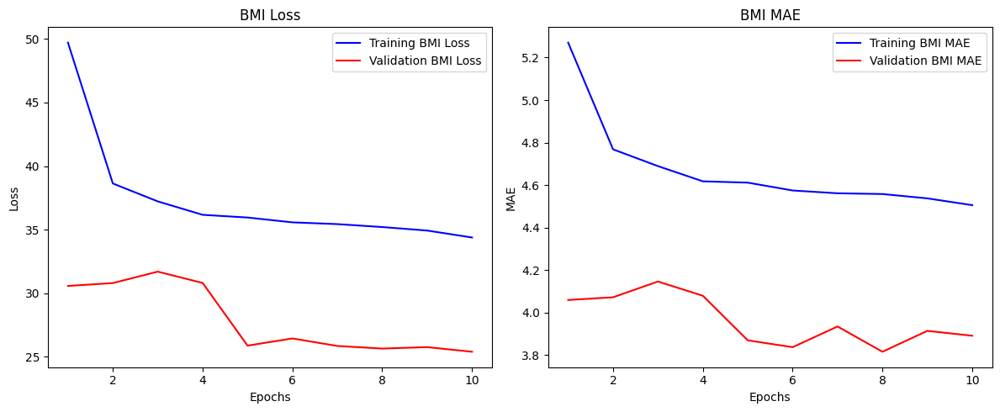

In [31]:
plot_history(history.history)

In [32]:
_, gender_loss, age_loss, bmi_loss, gender_acc, age_acc, bmi_acc = model.evaluate(test_dataset)
print("Gender Accuracy:", gender_acc)
print("Age Accuracy:", age_acc)
print("BMI Accuracy:", bmi_acc)

74/74 [==============================] - 43s 146ms/step - loss: 93.2974 - gender_loss: 0.0320 - age_loss: 67.8698 - bmi_loss: 25.3956 - gender_accuracy: 0.9884 - age_mae: 6.5113 - bmi_mae: 3.8914
Gender Accuracy: 0.9883720874786377
Age Accuracy: 6.511336803436279
BMI Accuracy: 3.89137601852417


# Model Evaluation

In [34]:
actual_gender = []
actual_age = []
actual_bmi = []

predicted_gender = []
predicted_age = []
predicted_bmi = []

for batch_images, batch_labels in test_dataset:
    pred_gender, pred_age, pred_bmi = model.predict(batch_images)
    pred_gender = np.round(pred_gender)
    predicted_gender.extend(pred_gender)
    predicted_age.extend(pred_age)
    predicted_bmi.extend(pred_bmi)

    act_gender, act_age, act_bmi = batch_labels['gender'], batch_labels['age'], batch_labels['bmi']
    actual_gender.extend(act_gender.numpy())
    actual_age.extend(act_age.numpy())
    actual_bmi.extend(act_bmi.numpy())

actual_gender = np.array(actual_gender)
actual_age = np.array(actual_age)
actual_bmi = np.array(actual_bmi)

predicted_gender = np.array(predicted_gender)
predicted_age = np.array(predicted_age)
predicted_bmi = np.array(predicted_bmi)

2/2 [==============================] - 3s 757ms/step


In [35]:
predicted_gender = predicted_gender.flatten().astype(int)
predicted_age = predicted_age.flatten().astype(float)
predicted_bmi = predicted_bmi.flatten().astype(float)

In [36]:
gender_results = calculate_results(y_true = actual_gender,
                                   y_pred = predicted_gender)
gender_results

{'accuracy': 98.83720930232558,
 'precision': 0.9884448663186205,
 'recall': 0.9883720930232558,
 'f1': 0.9882263660351711}

Confusion Matrix For Ethnicity:


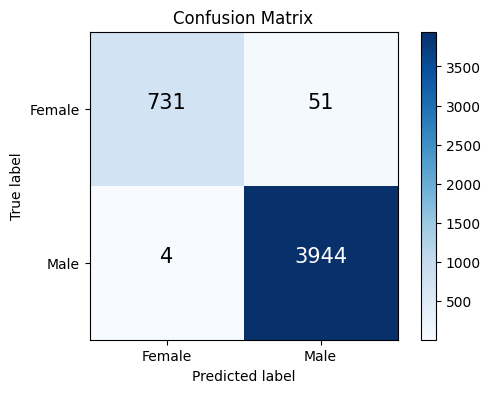

In [37]:
print("Confusion Matrix For Ethnicity:")
make_confusion_matrix(y_true = actual_gender,
                      y_pred = predicted_gender.flatten().astype(int),
                      classes = ['Female', 'Male'],
                      figsize = (6, 4))

In [38]:
print("Classification Report For Ethnicity:")
print(classification_report(actual_gender, predicted_gender))

Classification Report For Ethnicity:
              precision    recall  f1-score   support

           0       0.99      0.93      0.96       782
           1       0.99      1.00      0.99      3948

    accuracy                           0.99      4730
   macro avg       0.99      0.97      0.98      4730
weighted avg       0.99      0.99      0.99      4730



In [39]:
age_mae = mean_absolute_error(actual_age, predicted_age)
age_mse = mean_squared_error(actual_age, predicted_age)
age_rmse = np.sqrt(mean_squared_error(actual_age, predicted_age))
R2_score = r2_score(actual_age, predicted_age)

print('Mean Squared Error:', age_mae)
print('Root Mean Squared Error:', age_mse)
print('Mean Absolute Error:', age_rmse)
print('R-2 Score:', R2_score)

Mean Squared Error: 6.511335362238813
Root Mean Squared Error: 67.86983090302864
Mean Absolute Error: 8.238314809657897
R-2 Score: 0.5099023203907233


In [40]:
bmi_mae = mean_absolute_error(actual_bmi, predicted_bmi)
bmi_mse = mean_squared_error(actual_bmi, predicted_bmi)
bmi_rmse = np.sqrt(mean_squared_error(actual_bmi, predicted_bmi))
R2_score = r2_score(actual_bmi, predicted_bmi)

print('Mean Squared Error:', bmi_mae)
print('Root Mean Squared Error:', bmi_mse)
print('Mean Absolute Error:', bmi_rmse)
print('R-2 Score:', R2_score)

Mean Squared Error: 3.891376206637941
Root Mean Squared Error: 25.395635941754207
Mean Absolute Error: 5.039408292821113
R-2 Score: 0.14210435431637025


# Model at inference

In [41]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [42]:
model.save("Gender_Age_BMI_Prediction")

In [43]:
from tensorflow.keras.models import Model, load_model

loaded_model = load_model("Gender_Age_BMI_Prediction")
class_names = ['Female', 'Male']

def prediction(image_path):
    image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
    image = tf.cast(tf.image.resize(image, [128, 128]), dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)
    gender, age, bmi = loaded_model.predict(image)
    gender = np.round(int(gender[0]))
    gender = class_names[gender]
    print("Predicted Gender:", gender)
    print("Predicted Age:", age[0][0])
    print("Predicted BMI:", bmi[0][0])

In [44]:
prediction("/content/dataset/dataset/A00147.png")

1/1 [==============================] - 3s 3s/step
Predicted Gender: Female
Predicted Age: 48.38815
Predicted BMI: 30.298883


# Hugging Face

In [45]:
! pip install huggingface_hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 7.1 MB/s eta 0:00:00


In [46]:
from huggingface_hub import notebook_login
notebook_login()

In [47]:
from huggingface_hub.keras_mixin import push_to_hub_keras
push_to_hub_keras(model = model, repo_id = "DriveMyScream/Gender_Age_BMI_Prediction")

fingerprint.pb:   0%|          | 0.00/56.0 [00:00<?, ?B/s]

Upload 4 LFS files:   0%|          | 0/4 [00:00<?, ?it/s]

saved_model.pb:   0%|          | 0.00/5.90M [00:00<?, ?B/s]

variables.data-00000-of-00001:   0%|          | 0.00/184M [00:00<?, ?B/s]

keras_metadata.pb:   0%|          | 0.00/1.13M [00:00<?, ?B/s]

'https://huggingface.co/DriveMyScream/Gender_Age_BMI_Prediction/tree/main/'

In [48]:
from huggingface_hub import from_pretrained_keras
loaded_model = from_pretrained_keras("DriveMyScream/Gender_Age_BMI_Prediction")

config.json not found in HuggingFace Hub.


Fetching 8 files:   0%|          | 0/8 [00:00<?, ?it/s]

In [49]:
class_names = ['Female', 'Male']

def prediction(image_path):
    image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
    image = tf.cast(tf.image.resize(image, [128, 128]), dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)
    gender, age, bmi = model.predict(image)
    gender = np.round(int(gender[0]))
    gender = class_names[gender]
    print("Predicted Gender:", gender)
    print("Predicted Age:", age[0][0])
    print("Predicted BMI:", bmi[0][0])

In [50]:
prediction("/content/dataset/dataset/A00147.png")

1/1 [==============================] - 0s 35ms/step
Predicted Gender: Female
Predicted Age: 48.38815
Predicted BMI: 30.298883


# Tensorflow Lite

In [51]:
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
converter._experimental_lower_tensor_list_ops = False
tflite_model = converter.convert()

tflite_output_path = "Gender_Age_BMI_Prediction.tflite"
with open(tflite_output_path, "wb") as f:
    f.write(tflite_model)

In [52]:
class_names = ['Female', 'Male']

interpreter = tf.lite.Interpreter(model_path="Gender_Age_BMI_Prediction.tflite")
interpreter.allocate_tensors()

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

def prediction(image_path):
    image = tf.io.decode_png(tf.io.read_file(image_path), channels=3)
    image = tf.cast(tf.image.resize(image, [128, 128]), dtype=tf.float32)
    image = tf.expand_dims(image, axis=0)

    interpreter.set_tensor(input_details[0]['index'], image)
    interpreter.invoke()
    age = interpreter.get_tensor(output_details[0]['index'])
    bmi = interpreter.get_tensor(output_details[1]['index'])
    gender = interpreter.get_tensor(output_details[2]['index'])

    gender = np.round(gender[0][0])
    gender = class_names[int(gender)]
    print("Predicted Gender:", gender)
    print("Predicted Age:", age[0][0])
    print("Predicted BMI:", bmi[0][0])

In [53]:
prediction("/content/dataset/dataset/A00147.png")

Predicted Gender: Male
Predicted Age: 48.38818
Predicted BMI: 30.298885


# Helper Function

In [30]:
def plot_history(history):
    # Extract data for gender, age, and bmi
    train_gender_loss = history['gender_loss']
    val_gender_loss = history['val_gender_loss']
    train_age_loss = history['age_loss']
    val_age_loss = history['val_age_loss']
    train_bmi_loss = history['bmi_loss']
    val_bmi_loss = history['val_bmi_loss']
    train_gender_acc = history['gender_accuracy']
    val_gender_acc = history['val_gender_accuracy']
    train_age_mae = history['age_mae']
    val_age_mae = history['val_age_mae']
    train_bmi_mae = history['bmi_mae']
    val_bmi_mae = history['val_bmi_mae']

    epochs = range(1, len(train_gender_loss) + 1)

    # Plot Gender Loss and Accuracy
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_gender_loss, 'b', label='Training Gender Loss')
    plt.plot(epochs, val_gender_loss, 'r', label='Validation Gender Loss')
    plt.title('Gender Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_gender_acc, 'b', label='Training Gender Accuracy')
    plt.plot(epochs, val_gender_acc, 'r', label='Validation Gender Accuracy')
    plt.title('Gender Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Plot Age Loss and MAE
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_age_loss, 'b', label='Training Age Loss')
    plt.plot(epochs, val_age_loss, 'r', label='Validation Age Loss')
    plt.title('Age Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_age_mae, 'b', label='Training Age MAE')
    plt.plot(epochs, val_age_mae, 'r', label='Validation Age MAE')
    plt.title('Age MAE')
    plt.xlabel('Epochs')
    plt.ylabel('MAE')
    plt.legend()

    plt.tight_layout()
    plt.show()

    # Plot BMI Loss and MAE
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_bmi_loss, 'b', label='Training BMI Loss')
    plt.plot(epochs, val_bmi_loss, 'r', label='Validation BMI Loss')
    plt.title('BMI Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_bmi_mae, 'b', label='Training BMI MAE')
    plt.plot(epochs, val_bmi_mae, 'r', label='Validation BMI MAE')
    plt.title('BMI MAE')
    plt.xlabel('Epochs')
    plt.ylabel('MAE')
    plt.legend()

    plt.tight_layout()
    plt.show()